# 📝 Time Series - Machine Temperature

## 🌟 Highlights 
From this project "Time Series - Machine Temperature", the highlights are addressed as:
- ...

## ℹ️ Project Introduction 
**What is time series dataset**  
Time series data is data collected sequentially over time (e.g., every minute, hour, or day).  
A key characteristic is temporal dependency: the value at time t is often related to values at earlier times (t-1, t-2, …).  
Due to this specific characteristic, random split of data for analysis is not suitable and will pose a negative effect to the coming outcome.   

**Machine temperature time series data**  
In the manufacturing company, machine generates revenue by producing products.      
However, unexpected machine issue can result in production stop, defective products, and huge recovery cost.    
To balance production efficiency and machine maintenence, companyies rely on machine condition monitor as an important defense.

Among many machine monitor signals, machine operating temperature is one of the most critical indicators of meachine health.  
In this project, a time series dataset records machine operating temperature at different moment.  
By analyzing the relationship between machine temperature and time with time series analysis, many insights can be unveiled for necessary arrangment and action.   

## 🎯 Mission & Goal
As a data scentist working in manufacturing company, my main job is to monitor machine condition and flag any potential abnormality early.  
Using machine temperature time series data, this project aims to:
- Uncover the hidden pattern of the time series data
- Detect anomalies based on the machine operating temperature over time
- Forcast machine temperature to anticipate any future risk

## 🧠 Thinking



## 🏭 Build Flow
- Import libraries
- Data cleaning & EDA
- Anomaly detection
  - Z score method and improvement
- 

## 💡 To Do


### Import Libraries

In [67]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import numpy as np
import plotly.express as px

### Data cleaning & EDA
- Data collection frequency
- Data type correction
- Missing data
- Visualization
- Rolling mean & Rolling std

In [68]:
file = r'D:\coding\2026\time_series_analysis\realKnownCause\realKnownCause\machine_temperature_system_failure.csv'

df = pd.read_csv(file)
df.head(10)

,timestamp,value
0,2013-12-02 21:15:00,73.967322
1,2013-12-02 21:20:00,74.935882
2,2013-12-02 21:25:00,76.124162
3,2013-12-02 21:30:00,78.140707
4,2013-12-02 21:35:00,79.329836
5,2013-12-02 21:40:00,78.710418
6,2013-12-02 21:45:00,80.269784
7,2013-12-02 21:50:00,80.272828
8,2013-12-02 21:55:00,80.353425
9,2013-12-02 22:00:00,79.486523


Data is collected every 5 mins

In [69]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22695 entries, 0 to 22694
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   timestamp  22695 non-null  object 
 1   value      22695 non-null  float64
dtypes: float64(1), object(1)
memory usage: 354.7+ KB


timestamp column is not datetime data type 

In [70]:
# Change timestamp to datetime
df['time'] = pd.to_datetime(df['timestamp'])
df.head()

,timestamp,value,time
0,2013-12-02 21:15:00,73.967322,2013-12-02 21:15:00
1,2013-12-02 21:20:00,74.935882,2013-12-02 21:20:00
2,2013-12-02 21:25:00,76.124162,2013-12-02 21:25:00
3,2013-12-02 21:30:00,78.140707,2013-12-02 21:30:00
4,2013-12-02 21:35:00,79.329836,2013-12-02 21:35:00


In [71]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22695 entries, 0 to 22694
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   timestamp  22695 non-null  object        
 1   value      22695 non-null  float64       
 2   time       22695 non-null  datetime64[ns]
dtypes: datetime64[ns](1), float64(1), object(1)
memory usage: 532.0+ KB


In [72]:
print(df.shape)
df['value'].isnull().value_counts()

(22695, 3)


value
False    22695
Name: count, dtype: int64

No missing data

#### Visualization

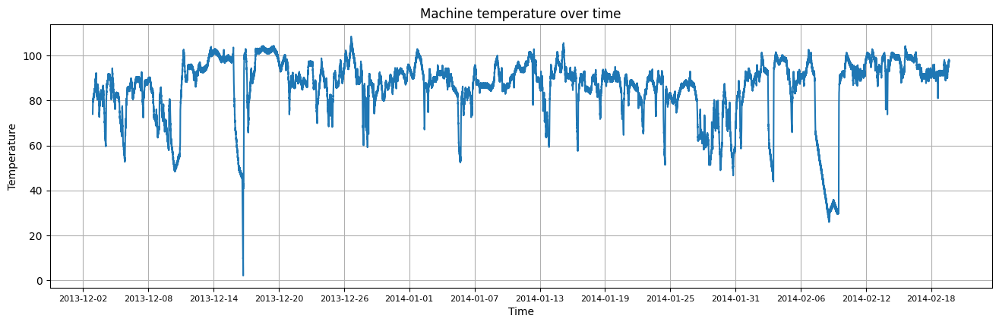

In [73]:
# Visualize line plot - temperature vs time
plt.figure(figsize=(16, 4.5))
plt.plot(df['time'], df['value'])
plt.xlabel('Time')
plt.ylabel('Temperature')
plt.xticks(fontsize=8)
plt.gca().xaxis.set_major_locator(mdates.DayLocator(interval=6))
plt.grid(True)
plt.title('Machine temperature over time')
plt.show()

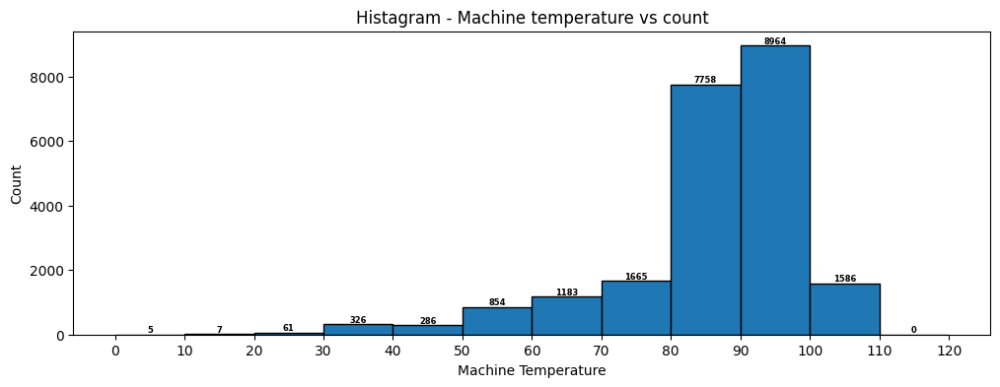

In [74]:
# Histagram
bin_size = range(0, 121, 10)
plt.figure(figsize=(12, 4))
value_count, baredge, bar = plt.hist(df['value'], bins=bin_size, edgecolor='black')

for c, edge, bar_ in zip(value_count, baredge, bar):
    plt.text(
        bar_.get_x() + bar_.get_width() / 2,
        bar_.get_height(),
        int(c),
        ha='center',
        va='bottom',
        fontsize=6,
        fontweight='bold',
        color='black',
    )
plt.xlabel('Machine Temperature')
plt.ylabel('Count')
plt.xticks(bin_size)
plt.title('Histagram - Machine temperature vs count')
plt.show()

Majority of temperature is around 80~100 degree

### Anomaly Detection
- Z score method: Rolling mean +/- 3sigma
  - Robustness improvement: rolling median and rolling MAD
- STL decomposition + anomaly on residual

#### Z score method

#### Rolling mean & Rolling std
**Rolling Mean (Moving average)**
- Rolling mean calculates the average of the most recent k point values. E.g. rolling mean of point t4 is average value of point t2, t3, and t4 (The most recent 3 point value). Rolling mean(t4) = mean(t2, t3, t4)
- Rolling mean gives insight about local trend
- High k: more global focus; Low k: more local focus

**Rolling standard deviation**
- Rolling std calculates how spread the most recent k point value is. E.g. rolling std of point t4 is sdt value of point t2, t3, and t4 (The most recent 3 values). Rolling std(t4) = std(t2, t3, t4)
- Rolling std gives insight about local stability

#### Rolling median & Rolling MAD: Used since they are less sensitive to dramatic value change
**Rolling median**
- Calculate the median value of the most recent k point values

**Rolling MAD**
- Calculate the median absolute deviation of the most recent k point values

In [176]:
rolling_window = 500

# Rolling mean
df['Rolling Mean'] = df['value'].rolling(rolling_window).mean()
'''
rolling_mean_list  = []
rolling_window = 280
for i in range(df.shape[0] + 1):
    start = i - rolling_window + 1
    end = i
    # print(i, start, end)
    if start < 0:
        rolling_mean_list.append(np.NaN)
        continue
    rolling_mean = round(df.loc[start:end, 'value'].mean(), 6)
    rolling_mean_list.append(rolling_mean)
    # print(df.loc[start:end, 'value'])
# print(rolling_mean_list)

df['Rolling Mean'] = pd.DataFrame(rolling_mean_list)
'''

# Rolling std
df['Rolling std'] = df['value'].rolling(rolling_window).std()
'''
rolling_std_list = []
for i in range(df.shape[0] + 1):
    start = i - rolling_window + 1
    end = i
    if start < 0:
        rolling_std_list.append(np.NaN)
        continue
    rolling_std = round(df.loc[start:end, 'value'].std(),6)
    rolling_std_list.append(rolling_std)
df['Rolling std'] = pd.DataFrame(rolling_std_list)
'''

# Rolling median
df['Rolling Median'] = df['value'].rolling(rolling_window).median()

# Rolling MAD
df['Rolling MAD'] = df['value'].rolling(rolling_window).apply(lambda x: (x - x.median()).abs().median())

In [177]:
df

,timestamp,value,time,Rolling Mean,Rolling std,Rolling Median,Rolling MAD,Upper bound-mean/std,Lower bound-mean/std,Upper bound-median/MAD,Lower bound-median/MAD
0,2013-12-02 21:15:00,73.967322,2013-12-02 21:15:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2013-12-02 21:20:00,74.935882,2013-12-02 21:20:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2013-12-02 21:25:00,76.124162,2013-12-02 21:25:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2013-12-02 21:30:00,78.140707,2013-12-02 21:30:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2013-12-02 21:35:00,79.329836,2013-12-02 21:35:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
22690,2014-02-19 15:05:00,98.185415,2014-02-19 15:05:00,92.356264,2.088255,92.242240,0.992506,99.109866,85.614300,96.851514,87.526423
22691,2014-02-19 15:10:00,97.804168,2014-02-19 15:10:00,92.371523,2.100122,92.254687,0.985163,99.173568,85.581196,96.870766,87.536165
22692,2014-02-19 15:15:00,97.135468,2014-02-19 15:15:00,92.383393,2.110238,92.263627,0.979429,99.223190,85.556171,96.884236,87.543304
22693,2014-02-19 15:20:00,98.056852,2014-02-19 15:20:00,92.398282,2.123935,92.274162,0.969511,99.288097,85.516750,96.889798,87.537742


In [178]:
# Threshold from rolling mean and rolling std
df['Upper bound-mean/std'] = df['Rolling Mean'] + 3 * df['Rolling std']
df['Lower bound-mean/std'] = df['Rolling Mean'] - 3 * df['Rolling std']

# Threshold from rolling median and rolling MAD
df['Upper bound-median/MAD'] = df['Rolling Median'] + 3 * 1.4826 * df['Rolling MAD']  # sigma_robust = 1.4826 * rolling MAD
df['Lower bound-median/MAD'] = df['Rolling Median'] - 3 * 1.4826 * df['Rolling MAD']
df

,timestamp,value,time,Rolling Mean,Rolling std,Rolling Median,Rolling MAD,Upper bound-mean/std,Lower bound-mean/std,Upper bound-median/MAD,Lower bound-median/MAD
0,2013-12-02 21:15:00,73.967322,2013-12-02 21:15:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2013-12-02 21:20:00,74.935882,2013-12-02 21:20:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2013-12-02 21:25:00,76.124162,2013-12-02 21:25:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2013-12-02 21:30:00,78.140707,2013-12-02 21:30:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2013-12-02 21:35:00,79.329836,2013-12-02 21:35:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
22690,2014-02-19 15:05:00,98.185415,2014-02-19 15:05:00,92.356264,2.088255,92.242240,0.992506,98.621027,86.091500,96.656710,87.827770
22691,2014-02-19 15:10:00,97.804168,2014-02-19 15:10:00,92.371523,2.100122,92.254687,0.985163,98.671889,86.071156,96.636495,87.872879
22692,2014-02-19 15:15:00,97.135468,2014-02-19 15:15:00,92.383393,2.110238,92.263627,0.979429,98.714108,86.052677,96.619932,87.907321
22693,2014-02-19 15:20:00,98.056852,2014-02-19 15:20:00,92.398282,2.123935,92.274162,0.969511,98.770088,86.026477,96.586353,87.961971


In [179]:
# Visualization - Line plot
def plot_temp_over_time(use_mode='mean/std', plot_rolling=False, plot_threshold=False, plot_anomaly=False):
    '''
    use_mode: To define using rolling mean/ rolling std or rolling median/ rolling MAD. 'mean/std' by default. Options: 'mean/std' and 'median/mad'

    '''
    plt.figure(figsize=(16, 4.5))
    plt.plot(df['time'], df['value'], label='Temperature-Raw')

    if use_mode == 'mean/std':
        if plot_rolling:
            plt.plot(df['time'], df['Rolling Mean'], linestyle='--', label='Temperature-Rolling mean')
        
        if plot_threshold:
            plt.plot(df['time'], df['Upper bound-mean/std'], linestyle='--', label='Upper bound')
            plt.plot(df['time'], df['Lower bound-mean/std'], linestyle='--', label='Lower bound')
    
        if plot_anomaly:
            df_anomaly = df[(df['value'] >= df['Upper bound-mean/std']) | (df['value'] <= df['Lower bound-mean/std'])]
            plt.plot(df_anomaly['time'], df_anomaly['value'], 'ro', label='Anomaly')

    elif use_mode == 'median/mad':
        if plot_rolling:
            plt.plot(df['time'], df['Rolling Median'], linestyle='--', label='Temperature-Rolling median')
        
        if plot_threshold:
            plt.plot(df['time'], df['Upper bound-median/MAD'], linestyle='--', label='Upper bound')
            plt.plot(df['time'], df['Lower bound-median/MAD'], linestyle='--', label='Lower bound')
    
        if plot_anomaly:
            df_anomaly = df[(df['value'] >= df['Upper bound-median/MAD']) | (df['value'] <= df['Lower bound-median/MAD'])]
            plt.plot(df_anomaly['time'], df_anomaly['value'], 'ro', label='Anomaly')
    
    plt.xlabel('Time')
    plt.ylabel('Machine Temperature')
    plt.xticks(fontsize=8)
    plt.gca().xaxis.set_major_locator(mdates.DayLocator(interval=6))
    plt.title('Machine temperature over time')
    plt.legend(loc='best')
    plt.show()

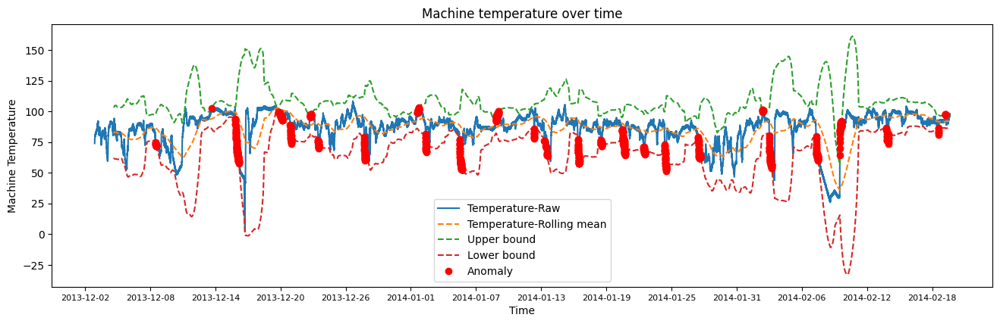

In [180]:
plot_temp_over_time(use_mode='mean/std', plot_rolling=True, plot_threshold=True, plot_anomaly=True)

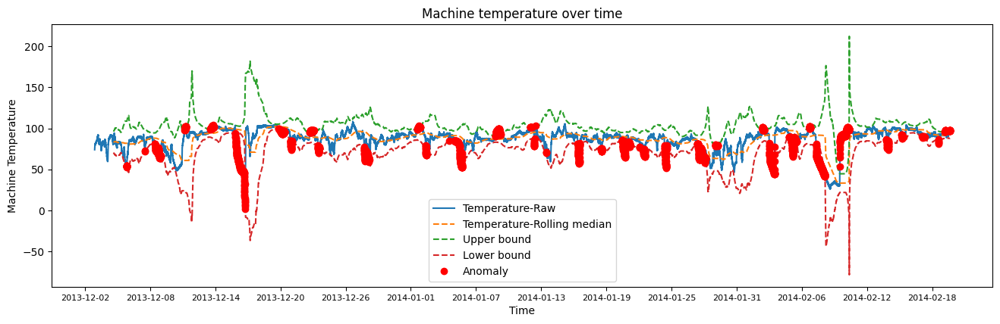

In [181]:
plot_temp_over_time(use_mode='median/mad', plot_rolling=True, plot_threshold=True, plot_anomaly=True)

In [188]:
# Visualization - Plotly
def plot_temp_over_time_plotly(use_mode='mean/std', plot_rolling=False, plot_threshold=False, plot_anomaly=False):
    fig = px.line(df,
                  x='time', 
                  y='value',
                  labels={
                      "value": "Machine Temperature"
                  },
                  width=1200,
                  height=450
                 )
    
    if use_mode == 'mean/std':
        if plot_rolling:
            fig.add_scatter(x=df['time'],
                            y=df['Rolling Mean'],
                            name='Rolling mean'
                           )
        if plot_threshold:
            fig.add_scatter(x=df['time'],
                            y=df['Upper bound-mean/std'],
                            name='Upper bound'
                           )
            fig.add_scatter(x=df['time'],
                            y=df['Lower bound-mean/std'],
                            name='Lower bound'
                           )
    
        if plot_anomaly:
            df_anomaly = df[(df['value'] >= df['Upper bound-mean/std']) | (df['value'] <= df['Lower bound-mean/std'])]
            fig.add_scatter(x=df_anomaly['time'],
                            y=df_anomaly['value'],
                            mode='markers',
                            marker=dict(color='red', size=8),
                            name='Anomaly'
                           )
    
    elif use_mode == 'median/mad':
        if plot_rolling:
            fig.add_scatter(x=df['time'],
                            y=df['Rolling Median'],
                            name='Rolling median'
                           )
        if plot_threshold:
            fig.add_scatter(x=df['time'],
                            y=df['Upper bound-median/MAD'],
                            name='Upper bound'
                           )
            fig.add_scatter(x=df['time'],
                            y=df['Lower bound-median/MAD'],
                            name='Lower bound'
                           )
    
        if plot_anomaly:
            df_anomaly = df[(df['value'] >= df['Upper bound-median/MAD']) | (df['value'] <= df['Lower bound-median/MAD'])]
            fig.add_scatter(x=df_anomaly['time'],
                            y=df_anomaly['value'],
                            mode='markers',
                            marker=dict(color='red', size=8),
                            name='Anomaly'
                           )    
    fig.for_each_trace(lambda t: t.update(
        name={
            'value': 'Temperature-Raw',
            '': 'Temperature-Raw',
        }.get(t.name, t.name)
    ))

    fig.update_traces(
        showlegend=True,
        selector=dict(name='Temperature-Raw')
    )
    
    fig.update_layout(
        legend_title_text=''
    )

    fig.show()

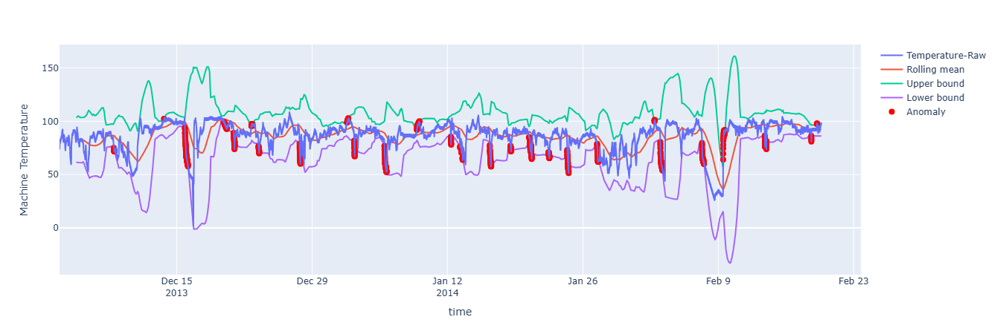

In [189]:
plot_temp_over_time_plotly(use_mode='mean/std', plot_rolling=True, plot_threshold=True, plot_anomaly=True)

Rolling mean and rolling MAD is sensitive to value change

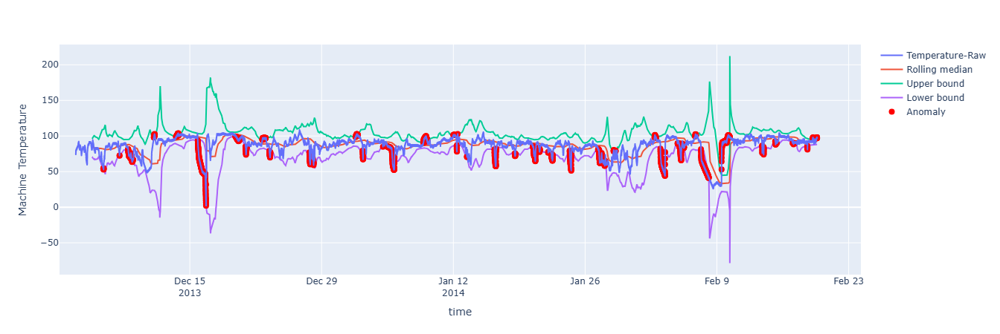

In [190]:
plot_temp_over_time_plotly(use_mode='median/mad', plot_rolling=True, plot_threshold=True, plot_anomaly=True)

**Z score method summary**
- Line plot visualization with matplotlib for report and plotly for exploratory
- Using Z score method (mean+/-3sigma) is sensitive to rolling window for anomaly detection. Z score method defines the normal context.
- To catch anomaly, rolling window can be set longer. In this case, threshold will take wide range of data (include realistically normal data value, ramp-up, and peak value) into account for detection.
  - Short rolling window: Rolling mean and std change to follow trend.
  - Longer rolling window than anomaly period: mean stays stable and std considers normal data (anomaly contributes less weight) to make anomaly stand out.
  - Rolling mean and rolling standard deviation fluctuate sensitively to the value change. More robust way is rolling median and rolling MAD